Análisis Exploratoria de Datos
==

En las últimas décadas, la resistencia bacteriana se ha convertido en una de las problemáticas más graves
a nivel mundial. Un agravante de esta problemática es que existe un declive en la búsqueda y desarrollo
de nuevas moléculas antimicrobianas que puedan ser usadas contra bacterias resistentes a los
antibióticos actuales. En parte, la disminución del interés en la investigación y desarrollo de nuevos
antibióticos se debe tanto al costo y el tiempo que requieren las pruebas en laboratorio necesarias en la
generación de nuevas moléculas antimicrobianas, como al escaso retorno de la inversión que esta
representa para las empresas farmacéuticas.

Como parte de solución a la problemática, los péptidos antimicrobianos (o AMPs, de su sigla en inglés
Antimicrobial Peptides) han tomado importancia en el desarrollo de nuevos antibióticos por su rol como
agente inhibidor, no solo de bacterias sino también de virus, hongos y parásitos, entre otros (Porto et al.,
2017; Yoshida et al., 2018). Los AMPs son parte esencial de todos los organismos vivos y configuran la
primera línea de defensa contra bacterias, microbios y parásitos. Este tipo de péptidos causan la muerte
de las bacterias y los microbios, bien sea interfiriendo las funcionalidades de la membrana celular o
interrumpiendo sus funciones intracelulares (Brogden, 2005; Yeaman & Yount, 2003). De ahí la
importancia que tienen el determinar la capacidad antimicrobiana de un péptido.

Si bien la identificación de péptidos antimicrobianos se ha desarrollado de manera manual, en los últimos
años se ha venido realizando importantes avances en lo que respecta al uso de los algoritmos de
inteligencia artificial. Esto puede tener un impacto positivo en el contexto farmacéutico dado que el uso
de algoritmos de aprendizaje automático puede reducir los costos y el tiempo empleados en el proceso
de búsqueda y diseño de nuevas biomoléculas sintéticas para la producción de antibióticos.
Lo anterior, ha motivado a que los grupos de investigación en Biología Funcional e Investigación y
Desarrollo en Inteligencia Artificial (GIDIA), ambos de Universidad Nacional, sede Medellín, y el grupo de
investigación en Automática Electrónica y Ciencias Computacionales (AEyCC) del ITM, unan sus esfuerzos
en la búsqueda y construcción de soluciones computacionales que apoyen la investigación y desarrollo de
nuevas moléculas antimicrobianas.

Como resultado parcial se ha recopilado, de las diferentes bases de datos de péptidos disponibles,
péptidos que se han identificado que pertenecen a una de dos clases: antimicrobianos y NO-
antimicrobianos. Para dicho conjunto de péptidos se ha calculado aproximadamente 1700 descriptores a
partir de propiedades como la carga eléctrica, la hidrofobicidad, el momento hidrofóbico, el punto
isoeléctrico, la estructura primaria y otras características fisicoquímicas de los péptidos.


Para el ejercicio se entregan 3 archivos:

- Base de datos positiva, la cual contiene los péptidos antimicrobianos.
- Base de datos negativa, la cual contiene los péptidos NO antimicrobianos.
- Un conjunto de validación para determinar el desempeño de los algoritmos seleccionados como mejores y con base  en la cual se determinará el orden de la competencia.

La competencia tiene dos partes. El informe de ser entregado en formato pdf y la implementación debe
ser entregada en un solo Notebook de Jupyter.

Parte 1: Clasificación sin selección
-
 1. Cargue los archivos de los conjuntos de datos y aplique normalización.
 2. Divida el conjunto de datos en 2 subconjuntos: un conjunto con el **80%** de las muestras para el entrenamiento (training) y otro con el **20%** restante como conjunto de pruebas (testing).
 3. Entrene mínimo 3 técnicas de clasificación diferentes, haciendo ajuste a los hyperparámetros.
 4. El clasificador debe ser entrenado con los datos de entrenamiento de la partición. Se debe usar validación cruzada para la medición del desempeño.
 5. Use el conjunto de prueba para evaluar los clasificadores. Las métricas a usar son: matriz de confusión, precision, recall y F1-score.
 
Parte2: Clasificación con selección:
-
 1. Sobre el conjunto de entrenamiento, aplique un método de selección y un método de extracción (o transformación) para seleccionar las mejores características del conjunto de datos (se aplican de manera independiente sobre el conjunto de datos original normalizado).
 2. Utilizar los clasificadores de la Parte1 con el nuevo conjunto de características. Pueden realizar hypertunning.
 3. Use el conjunto de prueba para evaluar los clasificadores. Las métricas a usar son: matriz de confusión, precision, recall y F1-score.
 4. Compare estos resultados con los clasificadores de la parte anterior. ¿Qué hallazgos hay?
 
Entregables.
-
 1. Informe. Se debe presentar un informe, no mayor a 6 páginas, con la metodología usada para la solución del problema, además de una descripción, análisis y discusión de los resultados obtenidos y las conclusiones generales del proyecto.
 
**Nota:** se espera que en el informe se describa cada una las pruebas realizadas. ¿Qué técnicas de
machine learning exploró? ¿Cuál conjunto de hyperparámetros ajustó? Analizar los resultados
por cada métrica de cada una de las técnicas exploradas. Mostrar los tiempos de entrenamiento
para cada una de las técnicas usadas. ¿Qué pasos fueron los de mayor complejidad y retadores?
 2. Desarrollo. Notebook (*.ipynb) con la solución completa, desde la carga de los datos hasta la visualización de resultados. El notebook debe estar correctamente comentado y con descripciones amplias en las celdas de mayor relevancia para la solución.
 
Los entregables deben ser enviados al correo srobles@unal.edu.co hasta el 14 de marzo de 2020 hasta
las 11:59pm.

Asunto del correo: CRP – G2 - Taller 4 Competencia

**Nota:** Aquellas entregas que no cumplan con el asunto del correo, no se tendrán en cuenta.

**Nota:** En la revisión de los informes, es posible que se llamen a los grupos para sustentar el trabajo
realizado.

Cargue de librerias
--


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import warnings
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import FactorAnalysis
from sklearn.decomposition import TruncatedSVD 
from sklearn.decomposition import FastICA 
from sklearn import manifold 
from sklearn.metrics import mean_squared_error
import xgboost as xgb # La instalación de conda solo es para linux - ojo

In [2]:
plt.style.use('ggplot')
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

Cargue de datos
--

Los datos consisten en tres archivos csv, positivos, negativos y de test.

In [3]:
positivos = pd.read_csv('Datos/DatosPositivos2.csv')
negativos = pd.read_csv('Datos/DatosNegativos2.csv')
test = pd.read_csv('Datos/DatosValidacion2.csv')

#### Descripción de datos

In [4]:
positivos.dtypes

Unnamed: 0                            int64
sequence                             object
length                                int64
molecular_weight                    float64
charge                              float64
charge_density                      float64
isoelectric_point                   float64
gravy                               float64
instability_index                   float64
aromaticity                         float64
aliphatic_index                     float64
boman_index                         float64
hydrophobic_ratio                   float64
A                                   float64
R                                   float64
N                                   float64
D                                   float64
C                                   float64
E                                   float64
Q                                   float64
G                                   float64
H                                   float64
I                               

In [5]:
positivos.head()

Unnamed: 0                   sequence  length  molecular_weight  charge  \
0           0        CGGYSGGWKRKRSTSYRCG      19           2109.36   4.859   
1           1           GIMISLMKKLAAHIAK      16           1725.22   3.094   
2           2          FKAWRWAWRMKKLAAPS      17           2133.57   4.995   
3           3       WGWRDIVAGIRKVAAPVLST      20           2195.57   1.996   
4           4  DTHFPICIFCCGCCRQSNCGMCCKT      25           2774.34   0.555   

   charge_density  isoelectric_point     gravy  instability_index  \
0        0.002304          10.056702 -1.310526          73.031579   
1        0.001793          10.302063  0.887500          20.918750   
2        0.002341          12.024475 -0.594118          43.088235   
3        0.000909          10.835022  0.435000          17.010000   
4        0.000200           7.713074  0.392000          31.272000   

   aromaticity  aliphatic_index  boman_index  hydrophobic_ratio       A  \
0     0.157895         0.000000     3.122105           0.105263   0.000   
1     0.000000       140.625000    -0.685000           0.625000  18.750   
2     0.235294        46.470588     1.494706           0.411765  23.529   
3     0.100000       117.000000     0.561500           0.450000  15.000   
4     0.080000        31.200000     0.972000           0.520000   0.000   

        R    N    D       C    E    Q       G     H      I       L       K  \
0  15.789  0.0  0.0  10.526  0.0  0.0  26.316  0.00   0.00   0.000  10.526   
1   0.000  0.0  0.0   0.000  0.0  0.0   6.250  6.25  18.75  12.500  18.750   
2  11.765  0.0  0.0   0.000  0.0  0.0   0.000  0.00   0.00   5.882  17.647   
3  10.000  0.0  5.0   0.000  0.0  0.0  10.000  0.00  10.00   5.000   5.000   
4   4.000  4.0  4.0  32.000  0.0  4.0   8.000  4.00   8.00   0.000   4.000   

        M      F      P       S      T       W       Y     V    AA   AR   AN  \
0   0.000  0.000  0.000  15.789  5.263   5.263  10.526   0.0  0.00  0.0  0.0   
1  12.500  0.000  0.000   6.250  0.000   0.000   0.000   0.0  6.67  0.0  0.0   
2   5.882  5.882  5.882   5.882  0.000  17.647   0.000   0.0  6.25  0.0  0.0   
3   0.000  0.000  5.000   5.000  5.000  10.000   0.000  15.0  5.26  0.0  0.0   
4   4.000  8.000  4.000   4.000  8.000   0.000   0.000   0.0  0.00  0.0  0.0   

    AD   AC   AE   AQ    AG    AH   AI   AL    AK   AM   AF    AP   AS   AT  \
0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.00  6.67  0.0  0.0  6.67  0.0  0.0  0.00  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.0  0.00  0.0  0.0  6.25  0.0  0.0   
3  0.0  0.0  0.0  0.0  5.26  0.00  0.0  0.0  0.00  0.0  0.0  5.26  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   

     AW   AY   AV   RA   RR   RN    RD    RC   RE    RQ   RG   RH   RI   RL  \
0   0.0  0.0  0.0  0.0  0.0  0.0  0.00  5.56  0.0  0.00  0.0  0.0  0.0  0.0   
1   0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.00  0.0  0.0  0.0  0.0   
2  12.5  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.00  0.0  0.0  0.0  0.0   
3   0.0  0.0  0.0  0.0  0.0  0.0  5.26  0.00  0.0  0.00  0.0  0.0  0.0  0.0   
4   0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  4.17  0.0  0.0  0.0  0.0   

     RK    RM   RF   RP    RS   RT    RW   RY   RV   NA   NR   NN   ND    NC  \
0  5.56  0.00  0.0  0.0  5.56  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
1  0.00  0.00  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
2  0.00  6.25  0.0  0.0  0.00  0.0  6.25  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
3  5.26  0.00  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
4  0.00  0.00  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  4.17   

    NE   NQ   NG   NH   NI   NL   NK   NM   NF   NP   NS   NT   NW   NY   NV  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0 

In [6]:
positivos.describe()

Unnamed: 0       length  molecular_weight       charge  \
count  8322.000000  8322.000000       8322.000000  8322.000000   
mean   4162.764840    17.960106       2066.565888     2.960491   
std    2404.195616     7.486211        805.508257     3.026472   
min       0.000000     6.000000        524.530000    -9.060000   
25%    2081.250000    12.000000       1446.757500     0.996000   
50%    4162.500000    17.000000       1949.305000     2.995000   
75%    6243.750000    23.000000       2588.865000     4.992750   
max    8326.000000    35.000000       4727.630000    21.991000   

       charge_density  isoelectric_point        gravy  instability_index  \
count     8322.000000        8322.000000  8322.000000        8322.000000   
mean         0.001457           9.387176    -0.137653          38.839221   
std          0.001437           2.414180     0.995135          49.654050   
min         -0.007838           3.259827    -4.380000         -71.779167   
25%          0.000542           8.333801    -0.756454           6.539423   
50%          0.001402          10.001404    -0.065045          28.056346   
75%          0.002495          11.000916     0.530769          57.846154   
max          0.006660          13.278748     3.523529         486.777778   

       aromaticity  aliphatic_index  boman_index  hydrophobic_ratio  \
count  8322.000000      8322.000000  8322.000000        8322.000000   
mean      0.116715        94.166338     1.350943           0.415836   
std       0.112488        51.713790     1.933077           0.155374   
min       0.000000         0.000000    -3.858235           0.000000   
25%       0.038462        55.714286     0.018889           0.333333   
50%       0.090909        92.500000     1.092083           0.428571   
75%       0.160000       130.000000     2.476471           0.523810   
max       0.833333       309.411765    13.046000           1.000000   

                 A            R           N            D            C  \
count  8322.000000  8322.000000  8322.00000  8322.000000  8322.000000   
mean      7.388295     9.107422     2.53841     1.903834     4.229614   
std       9.041099    12.079476     4.25807     4.382002     7.831948   
min       0.000000     0.000000     0.00000     0.000000     0.000000   
25%       0.000000     0.000000     0.00000     0.000000     0.000000   
50%       5.263000     4.762000     0.00000     0.000000     0.000000   
75%      11.429000    14.286000     4.76200     2.857000     6.061000   
max      90.000000    83.333000    33.33300    85.714000    50.000000   

                 E            Q            G            H            I  \
count  8322.000000  8322.000000  8322.000000  8322.000000  8322.000000   
mean      2.057844     2.200529     6.985417     2.079110     6.082167   
std       4.518366     4.412331     7.668295     4.807971     7.020435   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     0.000000     0.000000     0.000000     0.000000   
50%       0.000000     0.000000     5.714000     0.000000     4.762000   
75%       3.030000     3.333000    11.111000     0.000000    10.000000   
max      50.000000    42.857000    80.000000    61.905000    61.538000   

                 L            K            M            F            P  \
count  8322.000000  8322.000000  8322.000000  8322.000000  8322.000000   
mean     11.976253    12.879966     1.241821     5.027459     4.275250   
std      11.434855    12.690132     3.066756     6.898305     7.165815   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       3.333000     0.000000     0.000000     0.000000     0.000000   
50%       9.677000    10.000000     0.000000     2.941000     0.000000   
75%      16.667000    18.750000     0.000000     8.333000     6.667000   
max      70.000000    75.000000    40.000000    83.333000    67.857000   

                 S            T            W            Y            V  \
count  8322.000000  83

In [7]:
negativos.dtypes

Unnamed: 0                            int64
sequence                             object
length                                int64
molecular_weight                    float64
charge                              float64
charge_density                      float64
isoelectric_point                   float64
gravy                               float64
instability_index                   float64
aromaticity                         float64
aliphatic_index                     float64
boman_index                         float64
hydrophobic_ratio                   float64
A                                   float64
R                                   float64
N                                   float64
D                                   float64
C                                   float64
E                                   float64
Q                                   float64
G                                   float64
H                                   float64
I                               

In [8]:
negativos.head()

Unnamed: 0 sequence  length  molecular_weight  charge  charge_density  \
0           0  MAATRNK       7            790.93   1.996        0.002524   
1           1  MKMDGLR       7            850.06   0.996        0.001172   
2           2  MNIKHYQ       7            933.09   1.094        0.001172   
3           3  LLWNSIP       7            842.00  -0.004       -0.000005   
4           4  MHPHMSY       7            902.05   0.193        0.000214   

   isoelectric_point     gravy  instability_index  aromaticity  \
0          11.000305 -1.014286          77.657143     0.000000   
1           8.497986 -0.671429          82.657143     0.000000   
2           8.365906 -1.285714         121.985714     0.142857   
3           5.524963  0.757143          55.914286     0.142857   
4           6.688049 -0.900000         149.057143     0.142857   

   aliphatic_index  boman_index  hydrophobic_ratio       A       R       N  \
0        28.571429     3.387143           0.428571  28.571  14.286  14.286   
1        55.714286     2.661429           0.428571   0.000  14.286   0.000   
2        55.714286     2.180000           0.285714   0.000   0.000  14.286   
3       167.142857    -1.007143           0.428571   0.000   0.000  14.286   
4         0.000000     1.165714           0.285714   0.000   0.000   0.000   

        D    C    E       Q       G       H       I       L       K       M  \
0   0.000  0.0  0.0   0.000   0.000   0.000   0.000   0.000  14.286  14.286   
1  14.286  0.0  0.0   0.000  14.286   0.000   0.000  14.286  14.286  28.571   
2   0.000  0.0  0.0  14.286   0.000  14.286  14.286   0.000  14.286  14.286   
3   0.000  0.0  0.0   0.000   0.000   0.000  14.286  28.571   0.000   0.000   
4   0.000  0.0  0.0   0.000   0.000  28.571   0.000   0.000   0.000  28.571   

     F       P       S       T       W       Y    V     AA   AR   AN   AD  \
0  0.0   0.000   0.000  14.286   0.000   0.000  0.0  16.67  0.0  0.0  0.0   
1  0.0   0.000   0.000   0.000   0.000   0.000  0.0   0.00  0.0  0.0  0.0   
2  0.0   0.000   0.000   0.000   0.000  14.286  0.0   0.00  0.0  0.0  0.0   
3  0.0  14.286  14.286   0.000  14.286   0.000  0.0   0.00  0.0  0.0  0.0   
4  0.0  14.286  14.286   0.000   0.000  14.286  0.0   0.00  0.0  0.0  0.0   

    AC   AE   AQ   AG   AH   AI   AL   AK   AM   AF   AP   AS     AT   AW  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  16.67  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.00  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.00  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.00  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.00  0.0   

    AY   AV   RA   RR     RN   RD   RC   RE   RQ   RG   RH   RI   RL   RK  \
0  0.0  0.0  0.0  0.0  16.67  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    RM   RF   RP   RS   RT   RW   RY   RV   NA   NR   NN   ND   NC   NE   NQ  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    NG   NH     NI   NL     NK   NM   NF   NP     NS   NT   NW   NY   NV   DA  \
0  0.0  0.0   0.00  0.0  16.67  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0   0.00  0.0   0.00  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  16.67  0.0   0.00  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0

In [9]:
negativos.describe()

Unnamed: 0       length  molecular_weight      charge  charge_density  \
count  5561.000000  5561.000000       5561.000000  5561.00000     5561.000000   
mean   2780.546305    19.609962       2246.459347     0.69599        0.000283   
std    1606.262005     7.189959        825.130347     2.34795        0.001004   
min       0.000000     6.000000        652.740000   -13.89400       -0.004634   
25%    1390.000000    14.000000       1621.930000    -0.90300       -0.000307   
50%    2780.000000    19.000000       2145.550000     0.92800        0.000335   
75%    4170.000000    25.000000       2856.280000     1.99600        0.000899   
max    5566.000000    35.000000       4678.560000    21.99600        0.005005   

       isoelectric_point        gravy  instability_index  aromaticity  \
count        5561.000000  5561.000000        5561.000000  5561.000000   
mean            7.539058    -0.081833          40.552330     0.105055   
std             2.551504     0.879838          33.189909     0.082211   
min             3.124573    -3.814286         -43.391667     0.000000   
25%             5.274963    -0.654545          17.569697     0.050000   
50%             7.953430    -0.135714          36.546667     0.095238   
75%             9.688049     0.443478          58.800000     0.150000   
max            13.322205     3.483333         334.142424     0.600000   

       aliphatic_index  boman_index  hydrophobic_ratio            A  \
count      5561.000000  5561.000000        5561.000000  5561.000000   
mean         82.260596     1.337483           0.413705     6.800731   
std          40.903645     1.533903           0.138024     6.998961   
min           0.000000    -3.992500           0.000000     0.000000   
25%          53.500000     0.366923           0.320000     0.000000   
50%          79.375000     1.384000           0.400000     5.714000   
75%         107.000000     2.275000           0.500000    10.526000   
max         267.500000    10.167143           0.933333    67.742000   

                 R            N            D            C            E  \
count  5561.000000  5561.000000  5561.000000  5561.000000  5561.000000   
mean      6.447518     4.239511     4.142081     2.363212     4.099728   
std       6.721239     5.298497     5.334823     4.449299     5.332264   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     0.000000     0.000000     0.000000     0.000000   
50%       5.556000     3.125000     2.941000     0.000000     0.000000   
75%      10.000000     6.667000     6.667000     3.846000     6.667000   
max      67.742000    37.500000    42.857000    33.333000    42.857000   

                 Q            G            H            I            L  \
count  5561.000000  5561.000000  5561.000000  5561.000000  5561.000000   
mean      3.341611     6.388277     2.822218     5.696923     9.115518   
std       4.795490     6.759130     5.439559     6.155959     7.479077   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     0.000000     0.000000     0.000000     3.846000   
50%       0.000000     5.263000     0.000000     4.762000     8.333000   
75%       5.882000    10.000000     5.000000     9.091000    13.636000   
max      73.333000    55.556000    52.632000    40.000000    50.000000   

                 K            M            F            P            S  \
count  5561.000000  5561.000000  5561.000000  5561.000000  5561.000000   
mean      5.128646     5.791620     5.502006     4.672900     6.876794   
std       5.921174     4.330723     6.333469     5.792781     6.522818   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     3.333000     0.000000     0.000000     0.000000   
50%       4.167000     5.556000     4.762000     3.571000     5.882000   
75%       8.333000     8.000000     8.333000     7.143000    10.345000   
max      41.176000    40.000000    50.000000    55.556

In [10]:
test.dtypes

Unnamed: 0                            int64
sequence                             object
length                                int64
molecular_weight                    float64
charge                              float64
charge_density                      float64
isoelectric_point                   float64
gravy                               float64
instability_index                   float64
aromaticity                         float64
aliphatic_index                     float64
boman_index                         float64
hydrophobic_ratio                   float64
A                                   float64
R                                   float64
N                                   float64
D                                   float64
C                                   float64
E                                   float64
Q                                   float64
G                                   float64
H                                   float64
I                               

In [11]:
test.head()

Unnamed: 0                             sequence  length  molecular_weight  \
0           0    VVCACRRALCLPRERRAGFCRIRGRIHPLCCRR      33           3897.77   
1           1   GICACRRRFCPNSERFSGYCRVNGARYVRCCSRR      34           4003.64   
2           2  LRDLVCYCRSRGCKGRERMNGTCRKGHLLYTLCCR      35           4121.92   
3           3      RRCICTTRTCRFPYRRLGTCIFQNRVYTFCC      31           3838.56   
4           4    VCSCRLVFCRRTELRVGNCLIGGVSFTYCCTRV      33           3715.45   

   charge  charge_density  isoelectric_point     gravy  instability_index  \
0   8.691        0.002230          11.404358 -0.112121          84.766667   
1   7.590        0.001896          10.196106 -0.638235          76.035294   
2   6.689        0.001623           9.611023 -0.551429          16.851429   
3   6.589        0.001717           9.802917 -0.200000          53.977419   
4   3.591        0.000967           8.981384  0.660606          62.042424   

   aromaticity  aliphatic_index  boman_index  hydrophobic_ratio      A  \
0     0.030303        85.757576     3.333939           0.515152  9.091   
1     0.117647        34.411765     3.875588           0.382353  5.882   
2     0.057143        64.000000     3.107429           0.371429  0.000   
3     0.161290        47.096774     3.012581           0.419355  0.000   
4     0.090909        91.212121     1.404848           0.515152  0.000   

        R      N      D       C      E      Q       G      H      I       L  \
0  30.303  0.000  0.000  18.182  3.030  0.000   6.061  3.030  6.061   9.091   
1  26.471  5.882  0.000  17.647  2.941  0.000   8.824  0.000  2.941   0.000   
2  20.000  2.857  2.857  17.143  2.857  0.000  11.429  2.857  0.000  14.286   
3  22.581  3.226  0.000  19.355  0.000  3.226   3.226  0.000  6.452   3.226   
4  15.152  3.030  0.000  18.182  3.030  0.000   9.091  0.000  3.030   9.091   

       K      M      F      P      S       T    W      Y       V   AA    AR  \
0  0.000  0.000  3.030  6.061  0.000   0.000  0.0  0.000   6.061  0.0  0.00   
1  0.000  0.000  5.882  2.941  8.824   0.000  0.0  5.882   5.882  0.0  3.03   
2  5.714  2.857  0.000  0.000  2.857   5.714  0.0  5.714   2.857  0.0  0.00   
3  0.000  0.000  9.677  3.226  0.000  16.129  0.0  6.452   3.226  0.0  0.00   
4  0.000  0.000  6.061  0.000  6.061   9.091  0.0  3.030  15.152  0.0  0.00   

    AN   AD    AC   AE   AQ    AG   AH   AI    AL   AK   AM   AF   AP   AS  \
0  0.0  0.0  3.12  0.0  0.0  3.12  0.0  0.0  3.12  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  3.03  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0   

    AT   AW   AY   AV    RA    RR   RN    RD    RC    RE   RQ    RG   RH  \
0  0.0  0.0  0.0  0.0  6.25  9.38  0.0  0.00  0.00  3.12  0.0  3.12  0.0   
1  0.0  0.0  0.0  0.0  0.00  6.06  0.0  0.00  3.03  0.00  0.0  0.00  0.0   
2  0.0  0.0  0.0  0.0  0.00  0.00  0.0  2.94  0.00  2.94  0.0  2.94  0.0   
3  0.0  0.0  0.0  0.0  0.00  6.67  0.0  0.00  3.33  0.00  0.0  0.00  0.0   
4  0.0  0.0  0.0  0.0  0.00  3.12  0.0  0.00  0.00  0.00  0.0  0.00  0.0   

     RI    RL    RK    RM    RF   RP    RS    RT   RW    RY    RV   NA    NR  \
0  6.25  0.00  0.00  0.00  0.00  0.0  0.00  0.00  0.0  0.00  0.00  0.0  0.00   
1  0.00  0.00  0.00  0.00  6.06  0.0  0.00  0.00  0.0  3.03  3.03  0.0  0.00   
2  0.00  0.00  2.94  2.94  0.00  0.0  2.94  0.00  0.0  0.00  0.00  0.0  0.00   
3  0.00  3.33  0.00  0.00  3.33  0.0  0.00  3.33  0.0  0.00  3.33  0.0  3.33   
4  0.00  3.12  0.00  0.00  0.00  0.0  0.00  3.12  0.0  0.00  6.25  0.0  0.00   

    NN   ND    NC   NE   NQ    NG   NH   NI   NL   NK   NM   NF   NP    NS  \
0  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
1  0.0  0.0  0.00  0.0  0.0  3.03  0.0  0.0  0.0  0.0  0.0  0.0  0.0  3.03   
2  0.0  0.0  0.00  0.0 

In [12]:
test.describe()

Unnamed: 0       length  molecular_weight       charge  \
count  3265.000000  3265.000000       3265.000000  3265.000000   
mean   1644.243798    61.612557       6860.786490    -0.007706   
std     946.668148    82.245643       9171.009799     4.873713   
min       0.000000    11.000000       1001.050000   -61.788000   
25%     827.000000    25.000000       2804.910000    -2.003000   
50%    1645.000000    36.000000       3942.450000     0.001000   
75%    2463.000000    60.000000       6600.660000     2.199000   
max    3281.000000   710.000000      80917.550000    58.989000   

       charge_density  isoelectric_point        gravy  instability_index  \
count    3.265000e+03        3265.000000  3265.000000        3265.000000   
mean     6.103263e-05           7.123073    -0.212426          36.955831   
std      8.812725e-04           2.383477     0.588316          23.432635   
min     -5.167740e-03           2.996155    -2.496386         -28.508333   
25%     -4.581662e-04           4.891785    -0.545902          22.519355   
50%      2.419749e-07           6.534241    -0.230769          35.192553   
75%      5.718804e-04           9.306580     0.113889          49.250111   
max      3.397204e-03          13.204163     2.436842         233.426316   

       aromaticity  aliphatic_index  boman_index  hydrophobic_ratio  \
count  3265.000000      3265.000000  3265.000000        3265.000000   
mean      0.076949        89.267941     1.524232           0.390574   
std       0.052188        28.507901     1.074768           0.092039   
min       0.000000         0.000000    -2.735385           0.041667   
25%       0.041667        72.474227     0.891842           0.333333   
50%       0.071429        89.344262     1.540000           0.388889   
75%       0.105263       104.800000     2.138857           0.444444   
max       0.440000       240.000000     6.936471           0.818182   

                 A            R            N            D            C  \
count  3265.000000  3265.000000  3265.000000  3265.000000  3265.000000   
mean      8.371739     5.676984     3.990738     5.089867     2.068768   
std       5.909219     4.970902     3.798892     4.071889     3.916943   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       4.286000     2.500000     0.000000     2.326000     0.000000   
50%       7.692000     4.839000     3.341000     4.762000     0.000000   
75%      11.628000     7.937000     5.932000     7.473000     2.778000   
max      45.455000    38.235000    38.462000    33.333000    42.857000   

                 E            Q            G            H            I  \
count  3265.000000  3265.000000  3265.000000  3265.000000  3265.000000   
mean      6.510830     3.837831     7.748724     2.157909     6.241889   
std       5.281958     3.845636     5.192036     2.811535     4.481428   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       2.857000     0.000000     4.255000     0.000000     3.125000   
50%       5.882000     3.205000     7.143000     1.389000     5.882000   
75%       9.091000     5.634000    10.345000     3.333000     8.333000   
max      60.526000    33.333000    37.333000    26.316000    30.769000   

                 L            K            M            F            P  \
count  3265.000000  3265.000000  3265.000000  3265.000000  3265.000000   
mean      9.472580     6.565471     2.317472     3.822996     4.338812   
std       5.916955     5.296737     2.745178     3.727036     4.475815   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       5.556000     2.941000     0.000000     0.000000     0.000000   
50%       8.897000     5.747000     1.754000     3.279000     3.704000   
75%      12.500000     9.091000     3.571000     5.556000     6.349000   
max      53.846000    30.769000    20.000000    32.000000    53.165000   

                 S            T            W            Y            V  \
count  3265.0

la primera columna parece ser un indice exportado. Esto parece corroborarse con la comparación entre los elementos unicos y el total de elmentos por columna.  Y se confirma con los histogramas.

In [13]:
print(len(positivos['Unnamed: 0'].unique()),len(negativos['Unnamed: 0'].unique()),len(test['Unnamed: 0'].unique()))

8322 5561 3265


In [14]:
print(positivos['Unnamed: 0'].count(),negativos['Unnamed: 0'].count(),test['Unnamed: 0'].count())

8322 5561 3265


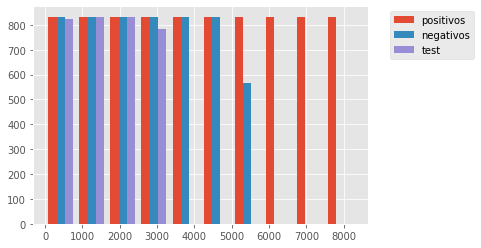

In [15]:
plt.hist([positivos['Unnamed: 0'],negativos['Unnamed: 0'],test['Unnamed: 0']], 
         label=['positivos', 'negativos','test'])

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [16]:
# borrado de datos
positivos = positivos.drop('Unnamed: 0', 1)
negativos = negativos.drop('Unnamed: 0', 1)
test = test.drop('Unnamed: 0', 1)


In [17]:
positivos.head()

sequence  length  molecular_weight  charge  \
0        CGGYSGGWKRKRSTSYRCG      19           2109.36   4.859   
1           GIMISLMKKLAAHIAK      16           1725.22   3.094   
2          FKAWRWAWRMKKLAAPS      17           2133.57   4.995   
3       WGWRDIVAGIRKVAAPVLST      20           2195.57   1.996   
4  DTHFPICIFCCGCCRQSNCGMCCKT      25           2774.34   0.555   

   charge_density  isoelectric_point     gravy  instability_index  \
0        0.002304          10.056702 -1.310526          73.031579   
1        0.001793          10.302063  0.887500          20.918750   
2        0.002341          12.024475 -0.594118          43.088235   
3        0.000909          10.835022  0.435000          17.010000   
4        0.000200           7.713074  0.392000          31.272000   

   aromaticity  aliphatic_index  boman_index  hydrophobic_ratio       A  \
0     0.157895         0.000000     3.122105           0.105263   0.000   
1     0.000000       140.625000    -0.685000           0.625000  18.750   
2     0.235294        46.470588     1.494706           0.411765  23.529   
3     0.100000       117.000000     0.561500           0.450000  15.000   
4     0.080000        31.200000     0.972000           0.520000   0.000   

        R    N    D       C    E    Q       G     H      I       L       K  \
0  15.789  0.0  0.0  10.526  0.0  0.0  26.316  0.00   0.00   0.000  10.526   
1   0.000  0.0  0.0   0.000  0.0  0.0   6.250  6.25  18.75  12.500  18.750   
2  11.765  0.0  0.0   0.000  0.0  0.0   0.000  0.00   0.00   5.882  17.647   
3  10.000  0.0  5.0   0.000  0.0  0.0  10.000  0.00  10.00   5.000   5.000   
4   4.000  4.0  4.0  32.000  0.0  4.0   8.000  4.00   8.00   0.000   4.000   

        M      F      P       S      T       W       Y     V    AA   AR   AN  \
0   0.000  0.000  0.000  15.789  5.263   5.263  10.526   0.0  0.00  0.0  0.0   
1  12.500  0.000  0.000   6.250  0.000   0.000   0.000   0.0  6.67  0.0  0.0   
2   5.882  5.882  5.882   5.882  0.000  17.647   0.000   0.0  6.25  0.0  0.0   
3   0.000  0.000  5.000   5.000  5.000  10.000   0.000  15.0  5.26  0.0  0.0   
4   4.000  8.000  4.000   4.000  8.000   0.000   0.000   0.0  0.00  0.0  0.0   

    AD   AC   AE   AQ    AG    AH   AI   AL    AK   AM   AF    AP   AS   AT  \
0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.00  6.67  0.0  0.0  6.67  0.0  0.0  0.00  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.0  0.00  0.0  0.0  6.25  0.0  0.0   
3  0.0  0.0  0.0  0.0  5.26  0.00  0.0  0.0  0.00  0.0  0.0  5.26  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   

     AW   AY   AV   RA   RR   RN    RD    RC   RE    RQ   RG   RH   RI   RL  \
0   0.0  0.0  0.0  0.0  0.0  0.0  0.00  5.56  0.0  0.00  0.0  0.0  0.0  0.0   
1   0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.00  0.0  0.0  0.0  0.0   
2  12.5  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.00  0.0  0.0  0.0  0.0   
3   0.0  0.0  0.0  0.0  0.0  0.0  5.26  0.00  0.0  0.00  0.0  0.0  0.0  0.0   
4   0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  4.17  0.0  0.0  0.0  0.0   

     RK    RM   RF   RP    RS   RT    RW   RY   RV   NA   NR   NN   ND    NC  \
0  5.56  0.00  0.0  0.0  5.56  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
1  0.00  0.00  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
2  0.00  6.25  0.0  0.0  0.00  0.0  6.25  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
3  5.26  0.00  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
4  0.00  0.00  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  4.17   

    NE   NQ   NG   NH   NI   NL   NK   NM   NF   NP   NS   NT   NW   NY   NV  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [18]:
negativos.head()

sequence  length  molecular_weight  charge  charge_density  \
0  MAATRNK       7            790.93   1.996        0.002524   
1  MKMDGLR       7            850.06   0.996        0.001172   
2  MNIKHYQ       7            933.09   1.094        0.001172   
3  LLWNSIP       7            842.00  -0.004       -0.000005   
4  MHPHMSY       7            902.05   0.193        0.000214   

   isoelectric_point     gravy  instability_index  aromaticity  \
0          11.000305 -1.014286          77.657143     0.000000   
1           8.497986 -0.671429          82.657143     0.000000   
2           8.365906 -1.285714         121.985714     0.142857   
3           5.524963  0.757143          55.914286     0.142857   
4           6.688049 -0.900000         149.057143     0.142857   

   aliphatic_index  boman_index  hydrophobic_ratio       A       R       N  \
0        28.571429     3.387143           0.428571  28.571  14.286  14.286   
1        55.714286     2.661429           0.428571   0.000  14.286   0.000   
2        55.714286     2.180000           0.285714   0.000   0.000  14.286   
3       167.142857    -1.007143           0.428571   0.000   0.000  14.286   
4         0.000000     1.165714           0.285714   0.000   0.000   0.000   

        D    C    E       Q       G       H       I       L       K       M  \
0   0.000  0.0  0.0   0.000   0.000   0.000   0.000   0.000  14.286  14.286   
1  14.286  0.0  0.0   0.000  14.286   0.000   0.000  14.286  14.286  28.571   
2   0.000  0.0  0.0  14.286   0.000  14.286  14.286   0.000  14.286  14.286   
3   0.000  0.0  0.0   0.000   0.000   0.000  14.286  28.571   0.000   0.000   
4   0.000  0.0  0.0   0.000   0.000  28.571   0.000   0.000   0.000  28.571   

     F       P       S       T       W       Y    V     AA   AR   AN   AD  \
0  0.0   0.000   0.000  14.286   0.000   0.000  0.0  16.67  0.0  0.0  0.0   
1  0.0   0.000   0.000   0.000   0.000   0.000  0.0   0.00  0.0  0.0  0.0   
2  0.0   0.000   0.000   0.000   0.000  14.286  0.0   0.00  0.0  0.0  0.0   
3  0.0  14.286  14.286   0.000  14.286   0.000  0.0   0.00  0.0  0.0  0.0   
4  0.0  14.286  14.286   0.000   0.000  14.286  0.0   0.00  0.0  0.0  0.0   

    AC   AE   AQ   AG   AH   AI   AL   AK   AM   AF   AP   AS     AT   AW  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  16.67  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.00  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.00  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.00  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.00  0.0   

    AY   AV   RA   RR     RN   RD   RC   RE   RQ   RG   RH   RI   RL   RK  \
0  0.0  0.0  0.0  0.0  16.67  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    RM   RF   RP   RS   RT   RW   RY   RV   NA   NR   NN   ND   NC   NE   NQ  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    NG   NH     NI   NL     NK   NM   NF   NP     NS   NT   NW   NY   NV   DA  \
0  0.0  0.0   0.00  0.0  16.67  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0   0.00  0.0   0.00  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  16.67  0.0   0.00  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0   0.00  0.0   0.00  0.0  0.0  0.0  16.67  0.0  0.0  0.0  0.0  0.0   
4

In [19]:
test.head()

sequence  length  molecular_weight  charge  \
0    VVCACRRALCLPRERRAGFCRIRGRIHPLCCRR      33           3897.77   8.691   
1   GICACRRRFCPNSERFSGYCRVNGARYVRCCSRR      34           4003.64   7.590   
2  LRDLVCYCRSRGCKGRERMNGTCRKGHLLYTLCCR      35           4121.92   6.689   
3      RRCICTTRTCRFPYRRLGTCIFQNRVYTFCC      31           3838.56   6.589   
4    VCSCRLVFCRRTELRVGNCLIGGVSFTYCCTRV      33           3715.45   3.591   

   charge_density  isoelectric_point     gravy  instability_index  \
0        0.002230          11.404358 -0.112121          84.766667   
1        0.001896          10.196106 -0.638235          76.035294   
2        0.001623           9.611023 -0.551429          16.851429   
3        0.001717           9.802917 -0.200000          53.977419   
4        0.000967           8.981384  0.660606          62.042424   

   aromaticity  aliphatic_index  boman_index  hydrophobic_ratio      A  \
0     0.030303        85.757576     3.333939           0.515152  9.091   
1     0.117647        34.411765     3.875588           0.382353  5.882   
2     0.057143        64.000000     3.107429           0.371429  0.000   
3     0.161290        47.096774     3.012581           0.419355  0.000   
4     0.090909        91.212121     1.404848           0.515152  0.000   

        R      N      D       C      E      Q       G      H      I       L  \
0  30.303  0.000  0.000  18.182  3.030  0.000   6.061  3.030  6.061   9.091   
1  26.471  5.882  0.000  17.647  2.941  0.000   8.824  0.000  2.941   0.000   
2  20.000  2.857  2.857  17.143  2.857  0.000  11.429  2.857  0.000  14.286   
3  22.581  3.226  0.000  19.355  0.000  3.226   3.226  0.000  6.452   3.226   
4  15.152  3.030  0.000  18.182  3.030  0.000   9.091  0.000  3.030   9.091   

       K      M      F      P      S       T    W      Y       V   AA    AR  \
0  0.000  0.000  3.030  6.061  0.000   0.000  0.0  0.000   6.061  0.0  0.00   
1  0.000  0.000  5.882  2.941  8.824   0.000  0.0  5.882   5.882  0.0  3.03   
2  5.714  2.857  0.000  0.000  2.857   5.714  0.0  5.714   2.857  0.0  0.00   
3  0.000  0.000  9.677  3.226  0.000  16.129  0.0  6.452   3.226  0.0  0.00   
4  0.000  0.000  6.061  0.000  6.061   9.091  0.0  3.030  15.152  0.0  0.00   

    AN   AD    AC   AE   AQ    AG   AH   AI    AL   AK   AM   AF   AP   AS  \
0  0.0  0.0  3.12  0.0  0.0  3.12  0.0  0.0  3.12  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  3.03  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0   
4  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0   

    AT   AW   AY   AV    RA    RR   RN    RD    RC    RE   RQ    RG   RH  \
0  0.0  0.0  0.0  0.0  6.25  9.38  0.0  0.00  0.00  3.12  0.0  3.12  0.0   
1  0.0  0.0  0.0  0.0  0.00  6.06  0.0  0.00  3.03  0.00  0.0  0.00  0.0   
2  0.0  0.0  0.0  0.0  0.00  0.00  0.0  2.94  0.00  2.94  0.0  2.94  0.0   
3  0.0  0.0  0.0  0.0  0.00  6.67  0.0  0.00  3.33  0.00  0.0  0.00  0.0   
4  0.0  0.0  0.0  0.0  0.00  3.12  0.0  0.00  0.00  0.00  0.0  0.00  0.0   

     RI    RL    RK    RM    RF   RP    RS    RT   RW    RY    RV   NA    NR  \
0  6.25  0.00  0.00  0.00  0.00  0.0  0.00  0.00  0.0  0.00  0.00  0.0  0.00   
1  0.00  0.00  0.00  0.00  6.06  0.0  0.00  0.00  0.0  3.03  3.03  0.0  0.00   
2  0.00  0.00  2.94  2.94  0.00  0.0  2.94  0.00  0.0  0.00  0.00  0.0  0.00   
3  0.00  3.33  0.00  0.00  3.33  0.0  0.00  3.33  0.0  0.00  3.33  0.0  3.33   
4  0.00  3.12  0.00  0.00  0.00  0.0  0.00  3.12  0.0  0.00  6.25  0.0  0.00   

    NN   ND    NC   NE   NQ    NG   NH   NI   NL   NK   NM   NF   NP    NS  \
0  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
1  0.0  0.0  0.00  0.0  0.0  3.03  0.0  0.0  0.0  0.0  0.0  0.0  0.0  3.03   
2  0.0  0.0  0.00  0.0  0.0  2.94  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
3  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0 

In [20]:
positivos.tail()

sequence  length  molecular_weight  charge  \
8317           ILPIIGKILSTIFGK      15           1613.04   1.995   
8318                 YAGAVANDL       9            892.96  -1.004   
8319           KKCFRWQWRMKKLGA      15           1966.43   5.927   
8320        GWAGWLLSPRGSRPSWGP      18           1967.20   1.996   
8321  LRRLYKRVVKLWKRLFRQLRRPVR      24           3237.00  10.994   

      charge_density  isoelectric_point     gravy  instability_index  \
8317        0.001237          10.002747  1.413333          30.873333   
8318       -0.001124           3.799866  0.522222          25.766667   
8319        0.003014          11.172302 -1.166667          36.200000   
8320        0.001015          12.000061 -0.616667          63.505556   
8321        0.003396          12.480896 -0.858333         129.737500   

      aromaticity  aliphatic_index  boman_index  hydrophobic_ratio       A  \
8317     0.066667       182.000000    -1.482000           0.533333   0.000   
8318     0.111111       108.888889     0.018889           0.555556  33.333   
8319     0.200000        32.666667     2.576000           0.333333   6.667   
8320     0.166667        48.888889     0.980000           0.166667   5.556   
8321     0.125000       117.500000     4.152500           0.375000   0.000   

           R       N       D      C    E      Q       G    H       I       L  \
8317   0.000   0.000   0.000  0.000  0.0  0.000  13.333  0.0  33.333  13.333   
8318   0.000  11.111  11.111  0.000  0.0  0.000  11.111  0.0   0.000  11.111   
8319  13.333   0.000   0.000  6.667  0.0  6.667   6.667  0.0   0.000   6.667   
8320  11.111   0.000   0.000  0.000  0.0  0.000  22.222  0.0   0.000  11.111   
8321  33.333   0.000   0.000  0.000  0.0  4.167   0.000  0.0   0.000  20.833   

           K      M      F       P       S      T       W       Y       V  \
8317  13.333  0.000  6.667   6.667   6.667  6.667   0.000   0.000   0.000   
8318   0.000  0.000  0.000   0.000   0.000  0.000   0.000  11.111  11.111   
8319  26.667  6.667  6.667   0.000   0.000  0.000  13.333   0.000   0.000   
8320   0.000  0.000  0.000  16.667  16.667  0.000  16.667   0.000   0.000   
8321  12.500  0.000  4.167   4.167   0.000  0.000   4.167   4.167  12.500   

       AA   AR    AN   AD   AC   AE   AQ     AG   AH   AI   AL   AK   AM   AF  \
8317  0.0  0.0   0.0  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0   
8318  0.0  0.0  12.5  0.0  0.0  0.0  0.0  12.50  0.0  0.0  0.0  0.0  0.0  0.0   
8319  0.0  0.0   0.0  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0   
8320  0.0  0.0   0.0  0.0  0.0  0.0  0.0   5.88  0.0  0.0  0.0  0.0  0.0  0.0   
8321  0.0  0.0   0.0  0.0  0.0  0.0  0.0   0.00  0.0  0.0  0.0  0.0  0.0  0.0   

       AP   AS   AT   AW   AY    AV   RA   RR   RN   RD   RC   RE    RQ    RG  \
8317  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00   
8318  0.0  0.0  0.0  0.0  0.0  12.5  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00   
8319  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00   
8320  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  5.88   
8321  0.0  0.0  0.0  0.0  0.0   0.0  0.0  8.7  0.0  0.0  0.0  0.0  4.35  0.00   

       RH   RI   RL   RK    RM   RF    RP   RS   RT    RW   RY    RV   NA  \
8317  0.0  0.0  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.00  0.0  0.00  0.0   
8318  0.0  0.0  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.00  0.0  0.00  0.0   
8319  0.0  0.0  0.0  0.0  7.14  0.0  0.00  0.0  0.0  7.14  0.0  0.00  0.0   
8320  0.0  0.0  0.0  0.0  0.00  0.0  5.88  0.0  0.0  0.00  0.0  0.00  0.0   
8321  0.0  0.0  8.7  0.0  0.00  0.0  4.35  0.0  0.0  0.00  0.0  4.35  0.0   

       NR   NN    ND   NC   NE   NQ   NG   NH   NI   NL   NK   NM   NF   NP  \
8317  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
8318  0.0  0.0  12.5  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
8319  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
8320  0.0  0.0

In [21]:
negativos.tail()

sequence  length  molecular_weight  charge  \
5556  ANNFDLMYEQVKFYGEVTQQMLKVSVLEMDGQFDR      35           4174.70  -3.000   
5557  ASKTPVGFIGLGNMGNPMAKNLMKHGYPLIIYDVF      35           3795.51   2.093   
5558  SPEVMKSLSENFCKAMDQCKQELNLPDEVIKDLYN      35           4060.62  -3.134   
5559  LAGGLTEPRPADTEIQEIANKVKPQLEEKTNKKYD      35           3925.37  -0.998   
5560  MNYFIMDKTFLEQEILLPQFIIQNIERWFKTHNFV      35           4448.18  -0.902   

      charge_density  isoelectric_point     gravy  instability_index  \
5556       -0.000719           4.296326 -0.431429          16.106000   
5557        0.000551           9.406311  0.240000          13.391429   
5558       -0.000772           4.440613 -0.657143          39.468571   
5559       -0.000254           5.231506 -1.185714          73.805714   
5560       -0.000203           5.510193  0.005714          81.328571   

      aromaticity  aliphatic_index  boman_index  hydrophobic_ratio      A  \
5556     0.142857        69.428571     1.820000           0.400000  2.857   
5557     0.114286        89.142857    -0.078000           0.428571  5.714   
5558     0.057143        75.142857     2.063143           0.371429  2.857   
5559     0.028571        72.571429     2.583429           0.257143  8.571   
5560     0.200000        97.428571     1.037714           0.457143  0.000   

          R      N      D      C       E       Q       G      H       I  \
5556  2.857  5.714  8.571  0.000   8.571  11.429   5.714  0.000   0.000   
5557  0.000  8.571  2.857  0.000   0.000   0.000  14.286  2.857   8.571   
5558  0.000  8.571  8.571  5.714  11.429   5.714   0.000  0.000   2.857   
5559  2.857  5.714  5.714  0.000  14.286   5.714   5.714  0.000   5.714   
5560  2.857  8.571  2.857  0.000   8.571   8.571   0.000  2.857  14.286   

           L       K      M       F      P      S      T      W      Y  \
5556   8.571   5.714  8.571   8.571  0.000  2.857  2.857  0.000  5.714   
5557   8.571   8.571  8.571   5.714  8.571  2.857  2.857  0.000  5.714   
5558  11.429  11.429  5.714   2.857  5.714  8.571  0.000  0.000  2.857   
5559   8.571  14.286  0.000   0.000  8.571  0.000  8.571  0.000  2.857   
5560   8.571   5.714  5.714  14.286  2.857  0.000  5.714  2.857  2.857   

           V   AA   AR    AN    AD   AC   AE   AQ    AG   AH   AI   AL    AK  \
5556  11.429  0.0  0.0  2.94  0.00  0.0  0.0  0.0  0.00  0.0  0.0  0.0  0.00   
5557   5.714  0.0  0.0  0.00  0.00  0.0  0.0  0.0  0.00  0.0  0.0  0.0  2.94   
5558   5.714  0.0  0.0  0.00  0.00  0.0  0.0  0.0  0.00  0.0  0.0  0.0  0.00   
5559   2.857  0.0  0.0  2.94  2.94  0.0  0.0  0.0  2.94  0.0  0.0  0.0  0.00   
5560   2.857  0.0  0.0  0.00  0.00  0.0  0.0  0.0  0.00  0.0  0.0  0.0  0.00   

        AM   AF   AP    AS   AT   AW   AY   AV   RA   RR   RN   RD   RC   RE  \
5556  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5557  0.00  0.0  0.0  2.94  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5558  2.94  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5559  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5560  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

       RQ   RG   RH   RI   RL   RK   RM   RF    RP   RS   RT    RW   RY   RV  \
5556  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   
5557  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   
5558  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   
5559  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.94  0.0  0.0  0.00  0.0  0.0   
5560  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.0  0.0  2.94  0.0  0.0   

       NA   NR    NN   ND   NC   NE   NQ   NG   NH    NI    NL    NK    NM  \
5556  0.0  0.0  2.94  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.00  0.00   
5557  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00  2.94  0.00  2.94   
5558  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00  2.94  0.00  0.00   
5559  0.0  

In [22]:
test.tail()

sequence  length  \
3260  TSSCIAQDNCTGLEQEQMISCKFNMTGLKRDKKKEYNETWYSADLV...     138   
3261  REMVTRHLLDSLAMQPYIASGTLADLGTGPGLPGIPLAITRPQLQV...     156   
3262  VDLTRPFTGDAQLALVTARDEADALELARHDYAHILAEAVQELFPG...     120   
3263  AVSALYRPGPMGMNSHTNYALRKNGQQEITPIHPELEKPLEEVLAV...     625   
3264              VEFRKIVHSVQKGEREARQAKKEMVEANLRLVISIAK      37   

      molecular_weight  charge  charge_density  isoelectric_point     gravy  \
3260          15862.69   0.459        0.000029           7.389709 -0.762319   
3261          16582.03  -2.296       -0.000138           6.162415  0.077564   
3262          13611.97 -11.784       -0.000866           4.503845 -0.475833   
3263          69069.75  -5.536       -0.000080           6.235901 -0.159520   
3264           4292.03   4.101        0.000955          10.156433 -0.451351   

      instability_index  aromaticity  aliphatic_index  boman_index  \
3260          42.137681     0.108696        40.289855     2.458696   
3261          31.861538     0.032051       110.128205     0.956154   
3262          62.202583     0.108333        77.500000     2.085833   
3263          31.033120     0.075200        94.240000     1.357952   
3264          11.218919     0.027027       102.702703     2.495946   

      hydrophobic_ratio       A       R      N      D      C       E      Q  \
3260           0.304348   4.348   5.797  8.696  4.348  7.971   6.522  4.348   
3261           0.429487  12.821   7.051  1.282  3.205  0.000   7.692  2.564   
3262           0.391667  15.833   7.500  0.833  9.167  0.000  11.667  3.333   
3263           0.403200   9.120   4.480  4.000  4.960  0.640   7.680  3.680   
3264           0.432432  10.811  10.811  2.703  0.000  0.000  13.514  5.405   

           G      H      I       L       K      M      F      P      S      T  \
3260   5.797  1.449  2.899   3.623   5.797  4.348  3.623  2.174  8.696  8.696   
3261  10.897  4.487  3.846  15.385   1.923  2.564  0.641  7.051  3.205  5.128   
3262   4.167  1.667  5.000   8.333   3.333  0.833  5.833  5.833  2.500  5.833   
3263   7.840  2.720  6.080   9.440   7.040  2.720  3.840  4.000  5.120  4.480   
3264   2.703  2.703  8.108   5.405  13.514  2.703  2.703  0.000  5.405  0.000   

          W      Y       V    AA    AR    AN    AD   AC    AE    AQ    AG  \
3260  2.174  5.072   3.623  0.00  0.00  0.00  0.73  0.0  0.73  0.73  0.00   
3261  0.641  1.923   7.692  1.29  1.94  0.00  0.65  0.0  1.29  0.00  1.29   
3262  2.500  2.500   3.333  1.68  2.52  0.84  0.84  0.0  3.36  0.84  0.00   
3263  0.640  3.040   8.480  0.80  0.00  0.16  0.32  0.0  0.32  0.64  1.28   
3264  0.000  0.000  13.514  0.00  2.78  2.78  0.00  0.0  0.00  0.00  0.00   

        AH    AI    AL    AK    AM    AF    AP    AS    AT    AW    AY    AV  \
3260  0.00  0.73  0.73  0.00  0.00  0.00  0.73  0.00  0.00  0.00  0.00  0.00   
3261  0.00  0.65  2.58  0.00  1.29  0.00  0.00  0.65  0.00  0.00  0.65  0.65   
3262  0.84  1.68  1.68  0.00  0.00  0.00  0.84  0.00  0.00  0.00  0.00  0.84   
3263  0.32  0.64  1.12  0.48  0.32  0.48  0.16  0.16  0.32  0.16  0.32  1.12   
3264  0.00  0.00  0.00  5.56  0.00  0.00  0.00  0.00  0.00  0.00  0.00  0.00   

        RA    RR    RN    RD    RC    RE    RQ   RG    RH    RI    RL    RK  \
3260  0.73  0.00  0.00  0.73  1.46  0.00  0.00  0.0  0.00  0.00  0.00  0.00   
3261  1.29  0.00  0.00  0.00  0.00  1.29  0.00  0.0  1.94  0.00  0.00  0.00   
3262  0.84  0.84  0.00  0.84  0.00  1.68  0.00  0.0  0.84  0.00  0.00  0.00   
3263  0.00  0.32  0.16  0.16  0.00  0.32  0.00  0.0  0.16  0.16  0.80  1.12   
3264  0.00  0.00  0.00  0.00  0.00  2.78  2.78  0.0  0.00  0.00  2.78  2.78   

        RM    RF    RP   RS    RT    RW    RY    RV    NA    NR    NN    ND  \
3260  0.73  0.73  0.00  0.0  0.00  0.00  0.73  0.00  0.00  0.73  0.73  0.73   
3261  0.00  0.65  1.29  0.0  0.00  0.00  0.00  0.65  0.65  0.00  0.00  0.00   
3262  0.00  0.00  1.68  0.0  0.00  0.84  0.00  0.00  0.00  0.00  0.00  0.00   
3263  0.32  0.00  0.16  0.0  0.32  0.00  0.16  0.32

In [23]:
# Conteo del número de columnas de los conjuntos de datos análizados
print(len(list(positivos.columns.values)),len(list(negativos.columns.values)),len(list(test.columns.values)))

1760 1760 1760


### Análisis de variables no flotantes

En el los tres conjuntos de datos, sólo hay tres variables que son objetos o enteros, por lo que podrían ser variables categorícas.  Las variables son:

- sequence                             object
- length                                int64
- class                                 int64

El siguiente es el histograma de las tres variables.

In [24]:
print(len(positivos['sequence'].unique()),len(negativos['sequence'].unique()),len(test['sequence'].unique()))

8322 5548 3265


La variable sequence es el identificador del petido, y por el número 

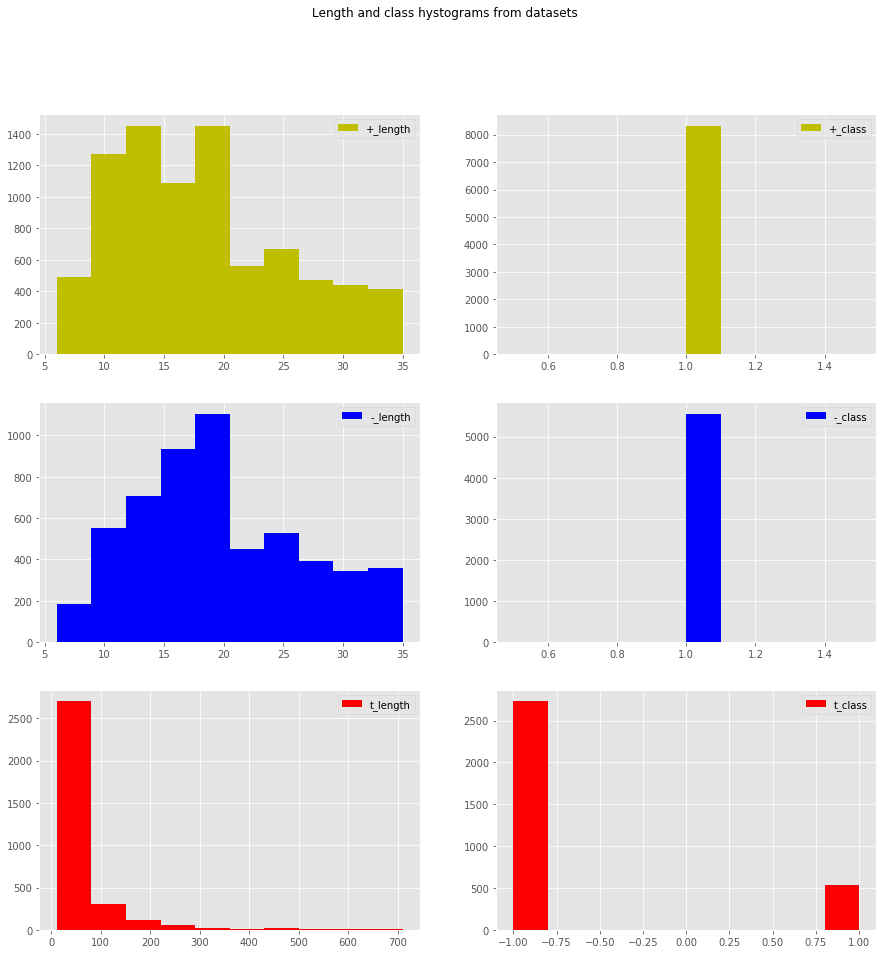

In [25]:
fig, ax = plt.subplots(3, 2, figsize=(15,15))
fig.suptitle('Length and class hystograms from datasets')
ax[0][0].hist([positivos['length']],label=['+_length'], color='y')
ax[0][0].legend()
ax[0][1].hist([positivos['class']],label=['+_class'], color='y')
ax[0][1].legend()
ax[1][0].hist([negativos['length']],label=['-_length'], color='b')
ax[1][0].legend()
ax[1][1].hist([negativos['class']],label=['-_class'], color='b')
ax[1][1].legend()
ax[2][0].hist([test['length']],label=['t_length'],color='r')
ax[2][0].legend()
ax[2][1].hist([test['class']],label=['t_class'],color='r')
ax[2][1].legend()

plt.show()

De los histogramas anteriores se desprende que las clases son iguales a a 1 para los conjuntos positivos y 
y negativos, mientras que las clases para el conjunto de test es son de dos clases, positivos y negativos.

Asumiendo que los negativos son más que los positivos, se va a definir en el conjunto negativos son de la clase -1.

In [26]:
print(positivos['class'].unique(),negativos['class'].unique(),test['class'].unique())

[1] [1] [ 1 -1]


In [27]:
negativos['class'].replace(1,-1,inplace=True)

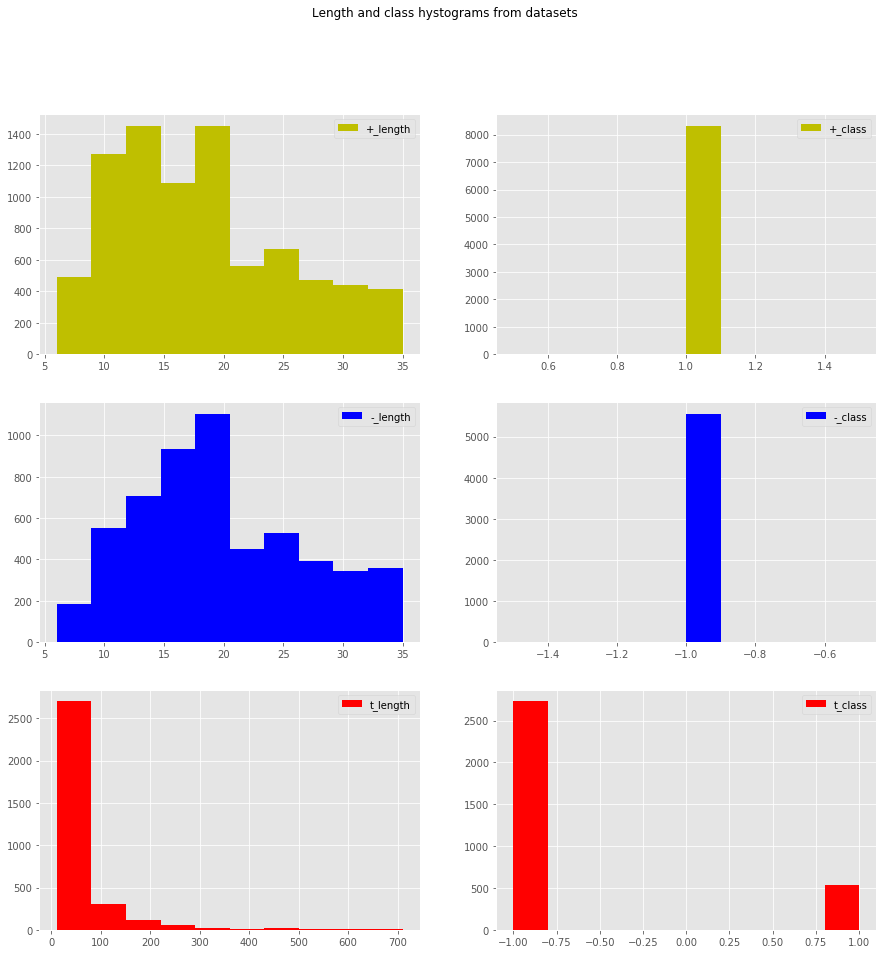

In [28]:
fig, ax = plt.subplots(3, 2, figsize=(15,15))
fig.suptitle('Length and class hystograms from datasets')
ax[0][0].hist([positivos['length']],label=['+_length'], color='y')
ax[0][0].legend()
ax[0][1].hist([positivos['class']],label=['+_class'], color='y')
ax[0][1].legend()
ax[1][0].hist([negativos['length']],label=['-_length'], color='b')
ax[1][0].legend()
ax[1][1].hist([negativos['class']],label=['-_class'], color='b')
ax[1][1].legend()
ax[2][0].hist([test['length']],label=['t_length'],color='r')
ax[2][0].legend()
ax[2][1].hist([test['class']],label=['t_class'],color='r')
ax[2][1].legend()

plt.show()

### Revisión de los nombres de los encabezados de los dataframes de los conjuntos de datos

In [29]:
# Revisión entre nombres de columnas conjuntos positivos y negativos

positivos_cols = positivos.columns
negativos_cols = negativos.columns

common_cols = positivos_cols.intersection(negativos_cols)
positivos_not_negativos = positivos_cols.difference(negativos_cols)

In [30]:
len(common_cols)

1760

In [31]:
len(positivos_not_negativos)

0

In [32]:
# Revisión entre nombres de columnas conjuntos positivos y test

positivos_cols = positivos.columns
test_cols = test.columns

common_cols_test = positivos_cols.intersection(test_cols)
positivos_not_test = positivos_cols.difference(test_cols)

In [33]:
len(common_cols_test)

1760

In [34]:
len(positivos_not_test)

0

Como se puede ver los nombres son iguales, por lo que se pueden unir los conjuntos positivos y negativos para generar un conjunto unico y poder realizar los análisis propios de analitica.

#### Creación de un dataframe conjunto para análisis

In [35]:
frames = [positivos, negativos]
peptidos = pd.concat(frames)

In [36]:
peptidos.describe()

length  molecular_weight        charge  charge_density  \
count  13883.000000      13883.000000  13883.000000    13883.000000   
mean      18.620975       2138.624343      2.053418        0.000987   
std        7.412932        818.158301      2.988259        0.001404   
min        6.000000        524.530000    -13.894000       -0.007838   
25%       13.000000       1502.930000     -0.003000       -0.000001   
50%       18.000000       2033.600000      1.929000        0.000870   
75%       24.000000       2696.130000      3.994000        0.001863   
max       35.000000       4727.630000     21.996000        0.006660   

       isoelectric_point         gravy  instability_index   aromaticity  \
count       13883.000000  13883.000000       13883.000000  13883.000000   
mean            8.646891     -0.115294          39.525427      0.112045   
std             2.630805      0.950993          43.815094      0.101608   
min             3.124573     -4.380000         -71.779167      0.000000   
25%             6.166931     -0.706905          10.454615      0.043478   
50%             9.307678     -0.096000          32.290000      0.093750   
75%            10.602478      0.500000          58.557381      0.153846   
max            13.322205      3.523529         486.777778      0.833333   

       aliphatic_index   boman_index  hydrophobic_ratio             A  \
count     13883.000000  13883.000000       13883.000000  13883.000000   
mean         89.397352      1.345552           0.414983      7.152939   
std          48.032890      1.783892           0.148666      8.288492   
min           0.000000     -3.992500           0.000000      0.000000   
25%          54.444444      0.142212           0.333333      0.000000   
50%          86.666667      1.230000           0.416667      5.556000   
75%         120.000000      2.384661           0.500000     11.111000   
max         309.411765     13.046000           1.000000     90.000000   

                  R             N             D             C             E  \
count  13883.000000  13883.000000  13883.000000  13883.000000  13883.000000   
mean       8.041966      3.219806      2.800390      3.482004      2.875744   
std       10.356372      4.775673      4.910368      6.747789      4.962504   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.000000      0.000000      0.000000      0.000000      0.000000   
50%        5.263000      0.000000      0.000000      0.000000      0.000000   
75%       11.765000      5.714000      5.000000      5.000000      5.000000   
max       83.333000     37.500000     85.714000     50.000000     50.000000   

                  Q             G             H             I             L  \
count  13883.000000  13883.000000  13883.000000  13883.000000  13883.000000   
mean       2.657603      6.746225      2.376771      5.927853     10.830352   
std        4.603583      7.323289      5.083283      6.690023     10.136327   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.000000      0.000000      0.000000      0.000000      3.448000   
50%        0.000000      5.556000      0.000000      4.762000      9.091000   
75%        4.762000     10.714000      3.571000     10.000000     15.385000   
max       73.333000     80.000000     61.905000     61.538000     70.000000   

                  K             M             F             P             S  \
count  13883.000000  13883.000000  13883.000000  13883.000000  13883.000000   
mean       9.775083      3.064297      5.217544      4.434534      5.415118   
std       11.180274      4.256768      6.681607      6.652587      6.369785   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.000000      0.000000      0.000000      0.000000      0.000000   
50%        6.667000      0.000000      3.704000      0.000000      4.167000   
75%       14.907500      5.556000      8.333000      6.667000 

In [37]:
peptidos.head()

sequence  length  molecular_weight  charge  \
0        CGGYSGGWKRKRSTSYRCG      19           2109.36   4.859   
1           GIMISLMKKLAAHIAK      16           1725.22   3.094   
2          FKAWRWAWRMKKLAAPS      17           2133.57   4.995   
3       WGWRDIVAGIRKVAAPVLST      20           2195.57   1.996   
4  DTHFPICIFCCGCCRQSNCGMCCKT      25           2774.34   0.555   

   charge_density  isoelectric_point     gravy  instability_index  \
0        0.002304          10.056702 -1.310526          73.031579   
1        0.001793          10.302063  0.887500          20.918750   
2        0.002341          12.024475 -0.594118          43.088235   
3        0.000909          10.835022  0.435000          17.010000   
4        0.000200           7.713074  0.392000          31.272000   

   aromaticity  aliphatic_index  boman_index  hydrophobic_ratio       A  \
0     0.157895         0.000000     3.122105           0.105263   0.000   
1     0.000000       140.625000    -0.685000           0.625000  18.750   
2     0.235294        46.470588     1.494706           0.411765  23.529   
3     0.100000       117.000000     0.561500           0.450000  15.000   
4     0.080000        31.200000     0.972000           0.520000   0.000   

        R    N    D       C    E    Q       G     H      I       L       K  \
0  15.789  0.0  0.0  10.526  0.0  0.0  26.316  0.00   0.00   0.000  10.526   
1   0.000  0.0  0.0   0.000  0.0  0.0   6.250  6.25  18.75  12.500  18.750   
2  11.765  0.0  0.0   0.000  0.0  0.0   0.000  0.00   0.00   5.882  17.647   
3  10.000  0.0  5.0   0.000  0.0  0.0  10.000  0.00  10.00   5.000   5.000   
4   4.000  4.0  4.0  32.000  0.0  4.0   8.000  4.00   8.00   0.000   4.000   

        M      F      P       S      T       W       Y     V    AA   AR   AN  \
0   0.000  0.000  0.000  15.789  5.263   5.263  10.526   0.0  0.00  0.0  0.0   
1  12.500  0.000  0.000   6.250  0.000   0.000   0.000   0.0  6.67  0.0  0.0   
2   5.882  5.882  5.882   5.882  0.000  17.647   0.000   0.0  6.25  0.0  0.0   
3   0.000  0.000  5.000   5.000  5.000  10.000   0.000  15.0  5.26  0.0  0.0   
4   4.000  8.000  4.000   4.000  8.000   0.000   0.000   0.0  0.00  0.0  0.0   

    AD   AC   AE   AQ    AG    AH   AI   AL    AK   AM   AF    AP   AS   AT  \
0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.00  6.67  0.0  0.0  6.67  0.0  0.0  0.00  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.0  0.00  0.0  0.0  6.25  0.0  0.0   
3  0.0  0.0  0.0  0.0  5.26  0.00  0.0  0.0  0.00  0.0  0.0  5.26  0.0  0.0   
4  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   

     AW   AY   AV   RA   RR   RN    RD    RC   RE    RQ   RG   RH   RI   RL  \
0   0.0  0.0  0.0  0.0  0.0  0.0  0.00  5.56  0.0  0.00  0.0  0.0  0.0  0.0   
1   0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.00  0.0  0.0  0.0  0.0   
2  12.5  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  0.00  0.0  0.0  0.0  0.0   
3   0.0  0.0  0.0  0.0  0.0  0.0  5.26  0.00  0.0  0.00  0.0  0.0  0.0  0.0   
4   0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.0  4.17  0.0  0.0  0.0  0.0   

     RK    RM   RF   RP    RS   RT    RW   RY   RV   NA   NR   NN   ND    NC  \
0  5.56  0.00  0.0  0.0  5.56  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
1  0.00  0.00  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
2  0.00  6.25  0.0  0.0  0.00  0.0  6.25  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
3  5.26  0.00  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00   
4  0.00  0.00  0.0  0.0  0.00  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  4.17   

    NE   NQ   NG   NH   NI   NL   NK   NM   NF   NP   NS   NT   NW   NY   NV  \
0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [38]:
peptidos.tail()

sequence  length  molecular_weight  charge  \
5556  ANNFDLMYEQVKFYGEVTQQMLKVSVLEMDGQFDR      35           4174.70  -3.000   
5557  ASKTPVGFIGLGNMGNPMAKNLMKHGYPLIIYDVF      35           3795.51   2.093   
5558  SPEVMKSLSENFCKAMDQCKQELNLPDEVIKDLYN      35           4060.62  -3.134   
5559  LAGGLTEPRPADTEIQEIANKVKPQLEEKTNKKYD      35           3925.37  -0.998   
5560  MNYFIMDKTFLEQEILLPQFIIQNIERWFKTHNFV      35           4448.18  -0.902   

      charge_density  isoelectric_point     gravy  instability_index  \
5556       -0.000719           4.296326 -0.431429          16.106000   
5557        0.000551           9.406311  0.240000          13.391429   
5558       -0.000772           4.440613 -0.657143          39.468571   
5559       -0.000254           5.231506 -1.185714          73.805714   
5560       -0.000203           5.510193  0.005714          81.328571   

      aromaticity  aliphatic_index  boman_index  hydrophobic_ratio      A  \
5556     0.142857        69.428571     1.820000           0.400000  2.857   
5557     0.114286        89.142857    -0.078000           0.428571  5.714   
5558     0.057143        75.142857     2.063143           0.371429  2.857   
5559     0.028571        72.571429     2.583429           0.257143  8.571   
5560     0.200000        97.428571     1.037714           0.457143  0.000   

          R      N      D      C       E       Q       G      H       I  \
5556  2.857  5.714  8.571  0.000   8.571  11.429   5.714  0.000   0.000   
5557  0.000  8.571  2.857  0.000   0.000   0.000  14.286  2.857   8.571   
5558  0.000  8.571  8.571  5.714  11.429   5.714   0.000  0.000   2.857   
5559  2.857  5.714  5.714  0.000  14.286   5.714   5.714  0.000   5.714   
5560  2.857  8.571  2.857  0.000   8.571   8.571   0.000  2.857  14.286   

           L       K      M       F      P      S      T      W      Y  \
5556   8.571   5.714  8.571   8.571  0.000  2.857  2.857  0.000  5.714   
5557   8.571   8.571  8.571   5.714  8.571  2.857  2.857  0.000  5.714   
5558  11.429  11.429  5.714   2.857  5.714  8.571  0.000  0.000  2.857   
5559   8.571  14.286  0.000   0.000  8.571  0.000  8.571  0.000  2.857   
5560   8.571   5.714  5.714  14.286  2.857  0.000  5.714  2.857  2.857   

           V   AA   AR    AN    AD   AC   AE   AQ    AG   AH   AI   AL    AK  \
5556  11.429  0.0  0.0  2.94  0.00  0.0  0.0  0.0  0.00  0.0  0.0  0.0  0.00   
5557   5.714  0.0  0.0  0.00  0.00  0.0  0.0  0.0  0.00  0.0  0.0  0.0  2.94   
5558   5.714  0.0  0.0  0.00  0.00  0.0  0.0  0.0  0.00  0.0  0.0  0.0  0.00   
5559   2.857  0.0  0.0  2.94  2.94  0.0  0.0  0.0  2.94  0.0  0.0  0.0  0.00   
5560   2.857  0.0  0.0  0.00  0.00  0.0  0.0  0.0  0.00  0.0  0.0  0.0  0.00   

        AM   AF   AP    AS   AT   AW   AY   AV   RA   RR   RN   RD   RC   RE  \
5556  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5557  0.00  0.0  0.0  2.94  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5558  2.94  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5559  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
5560  0.00  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

       RQ   RG   RH   RI   RL   RK   RM   RF    RP   RS   RT    RW   RY   RV  \
5556  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   
5557  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   
5558  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.0  0.0  0.00  0.0  0.0   
5559  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.94  0.0  0.0  0.00  0.0  0.0   
5560  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.0  0.0  2.94  0.0  0.0   

       NA   NR    NN   ND   NC   NE   NQ   NG   NH    NI    NL    NK    NM  \
5556  0.0  0.0  2.94  0.0  0.0  0.0  0.0  0.0  0.0  0.00  0.00  0.00  0.00   
5557  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00  2.94  0.00  2.94   
5558  0.0  0.0  0.00  0.0  0.0  0.0  0.0  0.0  0.0  0.00  2.94  0.00  0.00   
5559  0.0  

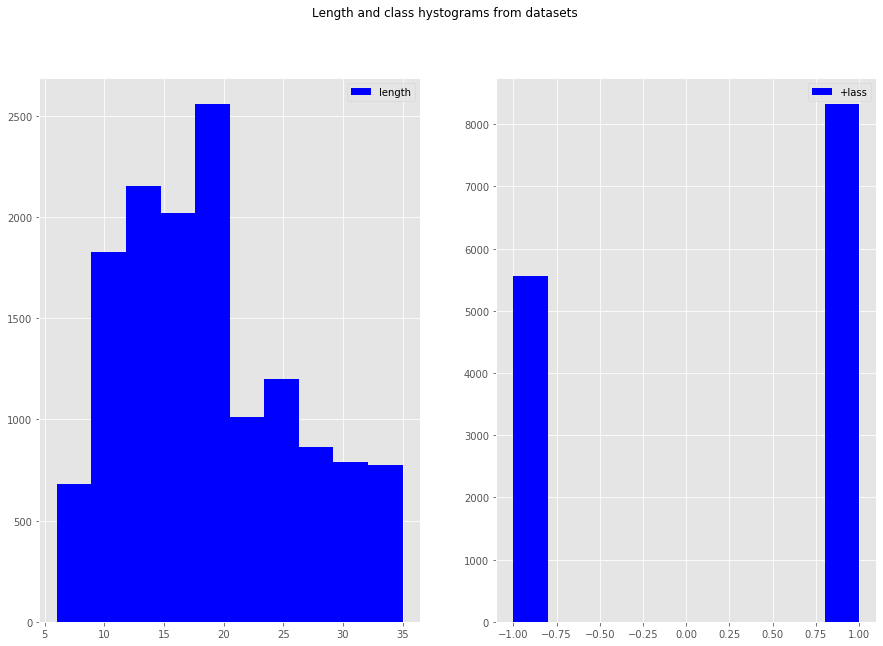

In [39]:
fig, ax = plt.subplots(1, 2, figsize=(15,10))
fig.suptitle('Length and class hystograms from datasets')
ax[0].hist([peptidos['length']],label=['length'], color='b')
ax[0].legend()
ax[1].hist([peptidos['class']],label=['+lass'], color='b')
ax[1].legend()
plt.show()

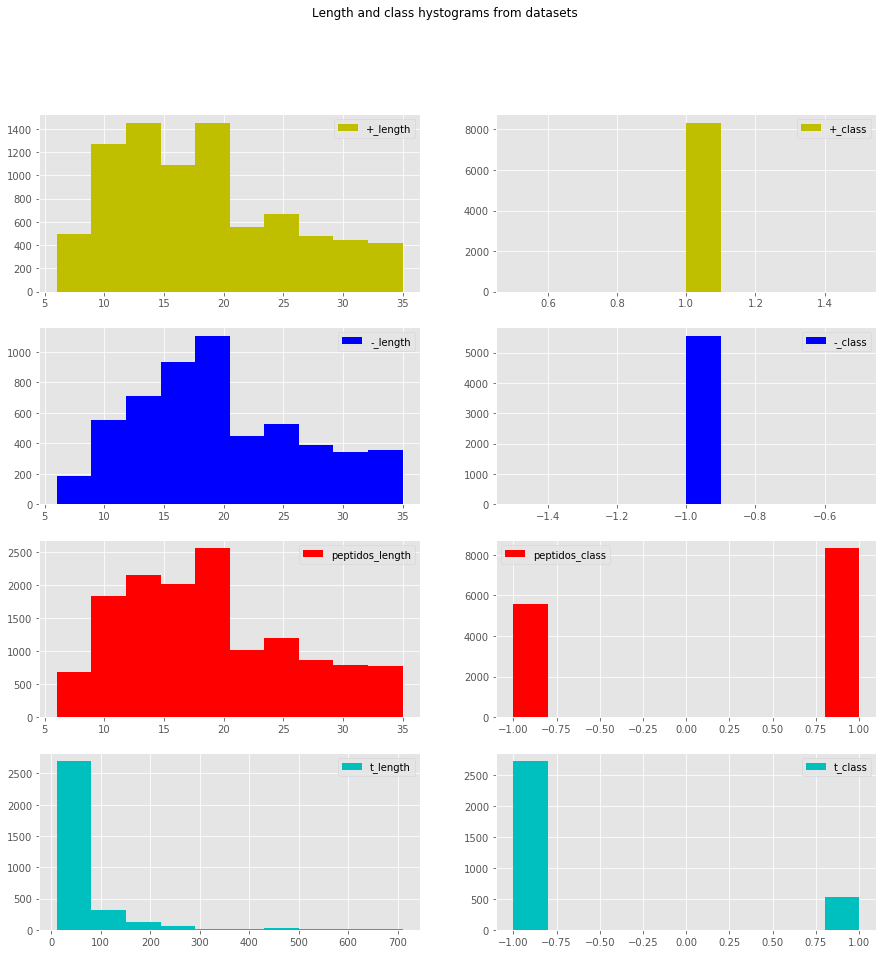

In [40]:
fig, ax = plt.subplots(4, 2, figsize=(15,15))
fig.suptitle('Length and class hystograms from datasets')
ax[0][0].hist([positivos['length']],label=['+_length'], color='y')
ax[0][0].legend()
ax[0][1].hist([positivos['class']],label=['+_class'], color='y')
ax[0][1].legend()
ax[1][0].hist([negativos['length']],label=['-_length'], color='b')
ax[1][0].legend()
ax[1][1].hist([negativos['class']],label=['-_class'], color='b')
ax[1][1].legend()
ax[2][0].hist([peptidos['length']],label=['peptidos_length'],color='r')
ax[2][0].legend()
ax[2][1].hist([peptidos['class']],label=['peptidos_class'],color='r')
ax[2][1].legend()
ax[3][0].hist([test['length']],label=['t_length'],color='c')
ax[3][0].legend()
ax[3][1].hist([test['class']],label=['t_class'],color='c')
ax[3][1].legend()

plt.show()

#### Creación de csv prepocesados

Se graban un conjunto completo unido, y nuevamente el de pruebas sin la columna de indice que se elimino.

In [41]:
peptidos.to_csv('train.csv', sep=',', encoding='utf-8',index=False)
test.to_csv('test.csv', sep=',', encoding='utf-8',index=False)